In [1]:
getwd()

[1] "/fast/AG_Bunina/Yusuf/Project_Endothelial_and_Stroke/Datasets/Chromatin_and_Gene_Exp/2024_C_A_Mannens_C_et_al/04_02_25"

In [2]:
here::here()

[1] "/fast/AG_Bunina/Yusuf/Project_Endothelial_and_Stroke/Datasets/Chromatin_and_Gene_Exp/2024_C_A_Mannens_C_et_al/04_02_25"

In [3]:
# load the R environment with the necessary packages such as Epiregulon:

my_epiregulon_lib <- here::here("renv", "library/linux-rhel-9.4/R-4.4/x86_64-unknown-linux-gnu")

In [4]:
.libPaths(new = my_epiregulon_lib, include.site = FALSE)

In [5]:
.libPaths()

[1] "/fast/AG_Bunina/Yusuf/Project_Endothelial_and_Stroke/Datasets/Chromatin_and_Gene_Exp/2024_C_A_Mannens_C_et_al/04_02_25/renv/library/linux-rhel-9.4/R-4.4/x86_64-unknown-linux-gnu"
[2] "/gnu/store/29x2k7i71g9xq09xmbj1lk515cl7if63-r-minimal-4.4.2/lib/R/library"

In [6]:
library(magrittr)

In [7]:
here::here('r_objects') |> list.dirs() %>% basename()

[1] "r_objects"               ".ipynb_checkpoints"     
[3] "TF_activity_chunks"      "pando_eGRN_chunks_final"

In [8]:
library(tidyverse)

-- Attaching core tidyverse packages ------------------------ tidyverse 2.0.0 --
v dplyr     1.1.4     v readr     2.1.5
v forcats   1.0.0     v stringr   1.5.1
v ggplot2   3.5.1     v tibble    3.2.1
v lubridate 1.9.3     v tidyr     1.3.1
v purrr     1.0.4     
-- Conflicts ------------------------------------------ tidyverse_conflicts() --
x tidyr::extract()   masks magrittr::extract()
x dplyr::filter()    masks stats::filter()
x dplyr::lag()       masks stats::lag()
x purrr::set_names() masks magrittr::set_names()
i Use the conflicted package (<http://conflicted.r-lib.org/>) to force all conflicts to become errors


In [9]:
library(Seurat)

Loading required package: SeuratObject

Loading required package: sp

'SeuratObject' was built under R 4.4.1 but the current version is
4.4.2; it is recomended that you reinstall 'SeuratObject' as the ABI
for R may have changed


Attaching package: 'SeuratObject'


The following objects are masked from 'package:base':

    intersect, t




In [10]:
library(Signac)

In [11]:
library(Pando)


Attaching package: 'Pando'


The following objects are masked from 'package:Seurat':

    GetAssay, VariableFeatures


The following objects are masked from 'package:SeuratObject':

    LayerData, VariableFeatures




In [12]:
coef_DF <- readRDS(here::here('r_objects', 'coef_DF_combined.RDS'))

In [13]:
fit_DF <- readRDS(here::here('r_objects', 'fit_DF_combined.RDS'))

In [14]:
features_vector <- readRDS(here::here('r_objects', 'features_vector_combined.RDS'))

In [15]:
features_vector %>% duplicated() %>% table()

.
FALSE  TRUE 
19042   182 

In [16]:
fit_DF %>% head()

target,rsq,nvariables
<chr>,<dbl>,<dbl>
NLGN4X,0.2163174,903
TMSB4X,0.3362312,2413
GPM6B,0.2650080,1651
IL1RAPL1,0.1397800,863
DMD,0.2407021,1391
CASK,0.1030510,959


In [17]:
fit_DF %>% pull(target) %>% duplicated() %>% table()

.
FALSE  TRUE 
 7021    70 

In [35]:
fit_DF %>% filter(target %in% target[duplicated(target)]) %>% arrange(target) %>% print(n = Inf)

# A tibble: 140 x 3
    target        rsq nvariables
    <chr>       <dbl>      <dbl>
  1 ABCA5     0.0323         206
  2 ABCA5     0.0314         193
  3 ACTN1     0.277         2142
  4 ACTN1     0.277         2142
  5 AKAP12    0.353         1769
  6 AKAP12    0.357         1880
  7 ANGEL1    0.00720         22
  8 ANGEL1    0.00761         23
  9 ANGPTL4   0.172          595
 10 ANGPTL4   0.179          687
 11 ANP32E    0.0281          46
 12 ANP32E    0.0276          45
 13 ARHGAP45  0.0771         492
 14 ARHGAP45  0.0781         485
 15 ARL3      0.0154          89
 16 ARL3      0.0161         106
 17 ATP1A3    0.0806         447
 18 ATP1A3    0.0845         509
 19 B3GAT1    0.0123          85
 20 B3GAT1    0.0120          83
 21 BMP6      0.214          789
 22 BMP6      0.215          794
 23 C1QTNF6   0.00273          8
 24 C1QTNF6   0.00273          8
 25 CD164     0.0495         554
 26 CD164     0.0481         523
 27 CD79B     0               27
 28 CD79B     0        

In [36]:
# Keep those with better rsq values.

In [37]:
coef_DF %>% filter(target %in% "ABCA5")

tf,target,region,term,estimate,std_err,statistic,pval,padj,corr
<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
FOXP2,ABCA5,chr17-68253364-68253555,chr17_68253364_68253555:FOXP2,0.015330693,0.007792262,1.9674253,4.913980e-02,2.804294e-01,0.1600814
NPAS3,ABCA5,chr17-68253559-68253765,chr17_68253559_68253765:NPAS3,0.005543287,0.005899022,0.9396960,3.473781e-01,7.497055e-01,0.1453599
FOXP2,ABCA5,chr17-68260120-68260389,FOXP2:chr17_68260120_68260389,-0.003857298,0.006034097,-0.6392502,5.226632e-01,8.556642e-01,0.1600814
FOXP2,ABCA5,chr17-68263130-68263378,FOXP2:chr17_68263130_68263378,0.007406636,0.004608664,1.6071111,1.080364e-01,4.382894e-01,0.1600814
BCL11A,ABCA5,chr17-68263130-68263378,chr17_68263130_68263378:BCL11A,-0.002796284,0.007169230,-0.3900396,6.965090e-01,9.255993e-01,0.1025562
RORA,ABCA5,chr17-68263383-68263531,chr17_68263383_68263531:RORA,0.001906895,0.003534011,0.5395840,5.894864e-01,8.867315e-01,0.1608804
BCL11A,ABCA5,chr17-68273795-68273889,BCL11A:chr17_68273795_68273889,0.020339717,0.009569317,2.1255140,3.354871e-02,2.210640e-01,0.1025562
TFAP2A,ABCA5,chr17-68291281-68291490,chr17_68291281_68291490:TFAP2A,0.104720511,0.012435256,8.4212589,3.823523e-17,6.627962e-15,0.1221688
EBF3,ABCA5,chr17-68291896-68292221,chr17_68291896_68292221:EBF3,0.027668954,0.005997921,4.6130910,3.977214e-06,1.546354e-04,0.1636212


In [38]:
coef_DF$region %>% lapply(length) %>% unlist() %>% table()

.
      1 
3729174 

In [39]:
coef_DF$region %>% length()

[1] 3729174

In [40]:
coef_DF %>% select(tf, target, region) %>% duplicated() %>% table()

.
  FALSE    TRUE 
3696132   33042 

In [42]:
coef_DF %>% select(tf, target, region) %>% duplicated() %>% head()

[1] FALSE FALSE FALSE FALSE FALSE FALSE

In [51]:
coef_DF %>%
  filter(duplicated(select(., tf, target, region))) %>%
  pull(tf) %>%
  unique() %>%
  length()

[1] 316

In [52]:
coef_DF %>%
  filter(duplicated(select(., tf, target, region))) %>%
  pull(target) %>%
  unique() %>%
  length()

[1] 67

I added each chunk's coef df using rbind function.\
Same also for fit dfs. I also concatanated the features\
vectors in the same order.

Now, I will keep the first occurences of the duplicate tf-target\
connections so that the fisrt chunk's data will be used for each\
consecutive chunks' overlapping target genes.

In [53]:
coef_DF_deduplicated <- 
                coef_DF %>%
                      filter(!duplicated(select(., tf, target, region)))

In [55]:
fit_DF_deduplicated <- 
                fit_DF %>% filter(!duplicated(select(., target)))

In [56]:
features_vector_deduplicated <- 
                features_vector[!duplicated(features_vector)]

In [58]:
# check that fit df should contain only unique target genes:

mannens_et_al_w_eGRNs_SLURM_c1 <- 
    readRDS(here::here('r_objects', 'pando_eGRN_chunks_final', 'mannens_et_al_w_eGRNs_SLURM_c1.RDS'))

In [59]:
mannens_et_al_w_eGRNs_SLURM_c1

An object of class "GRNData"
Slot "grn":
A RegulatoryNetwork object based on 1122 transcription factors

1 inferred network: glm_network

Slot "data":
An object of class Seurat 
430192 features across 49470 samples within 2 assays 
Active assay: RNA (25071 features, 5000 variable features)
 3 layers present: counts, data, scale.data
 1 other assay present: peaks


In [60]:
mannens_et_al_w_eGRNs_SLURM_c1@grn@networks$glm_network@fit %>% pull(target) %>% duplicated() %>% table()

.
FALSE 
  480 

In [61]:
# So they are unique. 
# Now I will create a new combined network object:

In [72]:
mannens_et_al_w_eGRNs_SLURM_c1@grn@networks$glm_network@coefs %>% pull(target) %>% unique() %>% length()

[1] 480

In [73]:
mannens_et_al_w_eGRNs_SLURM_c1 %>% NetworkFeatures() %>% length()

[1] 488

In [74]:
coef_DF_deduplicated %>% dim()

[1] 3696132      10

In [75]:
fit_DF_deduplicated %>% dim()

[1] 7021    3

In [76]:
fit_DF_deduplicated$target %>% duplicated() %>% table()

.
FALSE 
 7021 

In [77]:
coef_DF_deduplicated$target %>% unique() %>% length()

[1] 6893

In [78]:
features_vector_deduplicated %>% length()

[1] 19042

In [79]:
# Out of 19042 target genes with annotation info,
# Pando 

In [80]:
setdiff(fit_DF_deduplicated$target, unique(coef_DF_deduplicated$target)) %>% { filter(fit_DF_deduplicated, target %in% .) }

target,rsq,nvariables
<chr>,<dbl>,<dbl>
ART4,0,8
C14orf39,0,10
SELL,0,8
OR2L5,0,2
EGFL8,0,2
ARG1,0,14
PPP1R3A,0,16
LINC00939,0,14
ZSWIM2,0,7


In [81]:
setdiff(fit_DF_deduplicated$target, unique(coef_DF_deduplicated$target)) %>% { filter(fit_DF_deduplicated, target %in% .) } %>% summary()

    target               rsq      nvariables    
 Length:128         Min.   :0   Min.   : 1.000  
 Class :character   1st Qu.:0   1st Qu.: 2.000  
 Mode  :character   Median :0   Median : 5.000  
                    Mean   :0   Mean   : 6.844  
                    3rd Qu.:0   3rd Qu.: 9.000  
                    Max.   :0   Max.   :61.000  

In [87]:
find_modules

function (object, ...) 
{
    UseMethod(generic = "find_modules", object = object)
}
<bytecode: 0x224b2728>
<environment: namespace:Pando>

In [88]:
methods("find_modules")

[1] find_modules.GRNData* find_modules.Network*
see '?methods' for accessing help and source code

In [89]:
getS3method("find_modules", "Network") 

function (object, p_thresh = 0.05, rsq_thresh = 0.1, nvar_thresh = 10, 
    min_genes_per_module = 5, xgb_method = c("tf", "target"), 
    xgb_top = 50, verbose = TRUE) 
{
    fit_method <- NetworkParams(object)$method
    xgb_method <- match.arg(xgb_method)
    if (!fit_method %in% c("glm", "cv.glmnet", "glmnet", "brms", 
        "xgb")) {
        stop(paste0("find_modules() is not yet implemented for \"", 
            fit_method, "\" models"))
    }
    models_use <- gof(object) %>% filter(rsq > rsq_thresh & nvariables > 
        nvar_thresh) %>% pull(target) %>% unique()
    modules <- coef(object) %>% filter(target %in% models_use)
    if (fit_method %in% c("cv.glmnet", "glmnet")) {
        modules <- modules %>% filter(estimate != 0)
    }
    else if (fit_method == "xgb") {
        modules <- modules %>% group_by_at(xgb_method) %>% top_n(xgb_top, 
            gain) %>% mutate(estimate = sign(corr) * gain)
    }
    else {
        modules <- modules %>% filter(ifelse(is.na(padj), T, 
            padj < p_thresh))
    }
    modules <- modules %>% group_by(target) %>% mutate(nvars = n()) %>% 
        group_by(target, tf) %>% mutate(tf_sites_per_gene = n()) %>% 
        group_by(target) %>% mutate(tf_per_gene = length(unique(tf)), 
        peak_per_gene = length(unique(region))) %>% group_by(tf) %>% 
        mutate(gene_per_tf = length(unique(target))) %>% group_by(target, 
        tf)
    if (fit_method %in% c("cv.glmnet", "glmnet", "xgb")) {
        modules <- modules %>% reframe(estimate = sum(estimate), 
            n_regions = peak_per_gene, n_genes = gene_per_tf, 
            n_tfs = tf_per_gene, regions = paste(region, collapse = ";"))
    }
    else {
        modules <- modules %>% reframe(estimate = sum(estimate), 
            n_regions = peak_per_gene, n_genes = gene_per_tf, 
            n_tfs = tf_per_gene, regions = paste(region, collapse = ";"), 
            pval = min(pval), padj = min(padj))
    }
    modules <- modules %>% distinct() %>% arrange(tf)
    module_pos <- modules %>% filter(estimate > 0) %>% group_by(tf) %>% 
        filter(n() > min_genes_per_module) %>% group_split() %>% 
        {
            names(.) <- map_chr(., function(x) x$tf[[1]])
            .
        } %>% map(function(x) x$target)
    module_neg <- modules %>% filter(estimate < 0) %>% group_by(tf) %>% 
        filter(n() > min_genes_per_module) %>% group_split() %>% 
        {
            names(.) <- map_chr(., function(x) x$tf[[1]])
            .
        } %>% map(function(x) x$target)
    regions_pos <- modules %>% filter(estimate > 0) %>% group_by(tf) %>% 
        filter(n() > min_genes_per_module) %>% group_split() %>% 
        {
            names(.) <- map_chr(., function(x) x$tf[[1]])
            .
        } %>% map(function(x) unlist(str_split(x$regions, ";")))
    regions_neg <- modules %>% filter(estimate < 0) %>% group_by(tf) %>% 
        filter(n() > min_genes_per_module) %>% group_split() %>% 
        {
            names(.) <- map_chr(., function(x) x$tf[[1]])
            .
        } %>% map(function(x) unlist(str_split(x$regions, ";")))
    module_feats <- list(genes_pos = module_pos, genes_neg = module_neg, 
        regions_pos = regions_pos, regions_neg = regions_neg)
    log_message(paste0("Found ", length(unique(modules$tf)), 
        " TF modules"), verbose = verbose)
    module_meta <- select(modules, tf, target, everything())
    object@modules@meta <- module_meta
    object@modules@features <- module_feats
    object@modules@params <- list(p_thresh = p_thresh, rsq_thresh = rsq_thresh, 
        nvar_thresh = nvar_thresh, min_genes_per_module = min_genes_per_module)
    return(object)
}
<bytecode: 0x35f91b70>
<environment: namespace:Pando>

In [90]:
coef_DF %>% head()

tf,target,region,term,estimate,std_err,statistic,pval,padj,corr
<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
NFIB,NLGN4X,chrX-4850308-4850651,chrX_4850308_4850651:NFIB,0.038513008,0.01176352,3.2739367,0.001061345,0.02420174,0.2650796
ZFPM2,NLGN4X,chrX-4850308-4850651,chrX_4850308_4850651:ZFPM2,-0.007733542,0.01592443,-0.4856401,0.627224560,0.88962096,0.1124816
SOX11,NLGN4X,chrX-4850308-4850651,chrX_4850308_4850651:SOX11,0.065692288,0.02031582,3.2335530,0.001223423,0.02697227,0.1387585
SREBF2,NLGN4X,chrX-4850308-4850651,chrX_4850308_4850651:SREBF2,-0.011474373,0.01963357,-0.5844262,0.558936340,0.86081834,0.1436841
NFIX,NLGN4X,chrX-4850308-4850651,chrX_4850308_4850651:NFIX,0.038547242,0.02219537,1.7367245,0.082442149,0.40317544,0.2110484
PRDM16,NLGN4X,chrX-4850308-4850651,chrX_4850308_4850651:PRDM16,0.102150764,0.07533459,1.3559609,0.175117909,0.56993025,0.1478573


In [67]:
coef_DF %>% distinct(tf, target, region, .keep_all = TRUE) %>% dim()

[1] 3696132      10

In [68]:
coef_DF %>% distinct(tf, target, region, .keep_all = TRUE) %>% pull(target) %>% unique() %>% length()

[1] 6893

In [69]:
identical(coef_DF_deduplicated, coef_DF %>% distinct(tf, target, region, .keep_all = TRUE))

[1] TRUE

In [91]:
# Import the last eGRN object to test this:

mannens_et_al_w_eGRNs_SLURM_c51 <- 
    readRDS(here::here('r_objects', 'pando_eGRN_chunks_final', 'mannens_et_al_w_eGRNs_SLURM_c51.RDS'))

In [92]:
mannens_et_al_w_eGRNs_SLURM_c51@grn@networks$glm_network@fit %>% pull(target) %>% duplicated() %>% table()

.
FALSE 
   12 

In [93]:
mannens_et_al_w_eGRNs_SLURM_c51@grn@networks$glm_network@coefs %>% pull(target) %>% unique() %>% length()

[1] 9

In [94]:
mannens_et_al_w_eGRNs_SLURM_c51 %>% NetworkFeatures() %>% length()

[1] 165

In [96]:
mannens_et_al_w_eGRNs_SLURM_c51@grn@networks$glm_network@fit %>% pull(target) %>% setdiff(unique(coef(mannens_et_al_w_eGRNs_SLURM_c51)$target)) %>% dput()

c("CFB", "LINC00421", "TAS2R1")


In [102]:
mannens_et_al_w_eGRNs_SLURM_c51@grn@networks$glm_network@fit %>% filter(target %in% c("CFB", "LINC00421", "TAS2R1"))

target,rsq,nvariables
<chr>,<dbl>,<dbl>
CFB,0,2
LINC00421,0,1
TAS2R1,0,5


In [105]:
mannens_et_al_w_eGRNs_SLURM_c51@grn@networks$glm_network@fit %>% filter(!target %in% c("CFB", "LINC00421", "TAS2R1"))

target,rsq,nvariables
<chr>,<dbl>,<dbl>
SPANXN5,8.172829e-10,3
DEFB126,8.172830e-10,3
AC020743.3,2.676582e-09,9
OR10G6,1.714187e-01,13
SLURP1,1.615098e-09,4
LINC01400,1.075975e-01,10
APOL5,4.086330e-10,3
CALML5,3.605674e-01,33
OR4F6,8.172831e-10,3


======================================================================

IMPORTANT NOTE:

In a Pando eGRN object, Features contain all target genes for which annottaion info\
exists in the Annotation onject of the inputted chromatin assay.

Fit data.frame contains the target genes that are the fragment of Features that Pando could fit a model.

"coef" data.frame contains informative metrics for only those target genes in the\
"fit" data.frame with non-zero "rsq" values.

So one should expect that most of the times the length of :

input_genes > Features > fit$target > unique(coef's target)

=======================================================================

In [106]:
# Create a new Pando Object:

mannens_et_al_w_JOINT_eGRNs <- mannens_et_al_w_eGRNs_SLURM_c1

In [107]:
mannens_et_al_w_JOINT_eGRNs@grn@networks$glm_network@fit <- fit_DF_deduplicated

In [108]:
mannens_et_al_w_JOINT_eGRNs@grn@networks$glm_network@coefs <- coef_DF_deduplicated

In [111]:
mannens_et_al_w_JOINT_eGRNs@grn@networks$glm_network@features  <- features_vector_deduplicated

In [112]:
mannens_et_al_w_JOINT_eGRNs

An object of class "GRNData"
Slot "grn":
A RegulatoryNetwork object based on 1122 transcription factors

1 inferred network: glm_network

Slot "data":
An object of class Seurat 
430192 features across 49470 samples within 2 assays 
Active assay: RNA (25071 features, 5000 variable features)
 3 layers present: counts, data, scale.data
 1 other assay present: peaks


In [113]:
mannens_et_al_w_JOINT_eGRNs %>% NetworkFeatures() %>% length()

[1] 19042

In [114]:
mannens_et_al_w_JOINT_eGRNs %>% coef() %>% dim()

[1] 3696132      10

In [115]:
mannens_et_al_w_JOINT_eGRNs@grn@networks$glm_network@fit %>% head()

target,rsq,nvariables
<chr>,<dbl>,<dbl>
NLGN4X,0.2163174,903
TMSB4X,0.3362312,2413
GPM6B,0.2650080,1651
IL1RAPL1,0.1397800,863
DMD,0.2407021,1391
CASK,0.1030510,959


In [116]:
mannens_et_al_w_JOINT_eGRNs@grn@networks$glm_network@fit %>% dim()

[1] 7021    3

In [117]:
mannens_et_al_w_JOINT_eGRNs@grn@regions

An Regions object
with 459186 candidate genomic regions in 306458 peaks

In [119]:
mannens_et_al_w_eGRNs_SLURM_c1@grn@regions

An Regions object
with 459186 candidate genomic regions in 306458 peaks

In [120]:
mannens_et_al_w_eGRNs_SLURM_c51@grn@regions

An Regions object
with 459186 candidate genomic regions in 306458 peaks

In [121]:
mannens_et_al_w_eGRNs_SLURM_c1

An object of class "GRNData"
Slot "grn":
A RegulatoryNetwork object based on 1122 transcription factors

1 inferred network: glm_network

Slot "data":
An object of class Seurat 
430192 features across 49470 samples within 2 assays 
Active assay: RNA (25071 features, 5000 variable features)
 3 layers present: counts, data, scale.data
 1 other assay present: peaks


In [122]:
mannens_et_al_w_eGRNs_SLURM_c51

An object of class "GRNData"
Slot "grn":
A RegulatoryNetwork object based on 1122 transcription factors

1 inferred network: glm_network

Slot "data":
An object of class Seurat 
430192 features across 49470 samples within 2 assays 
Active assay: RNA (25071 features, 5000 variable features)
 3 layers present: counts, data, scale.data
 1 other assay present: peaks


In [123]:
mannens_et_al_w_JOINT_eGRNs

An object of class "GRNData"
Slot "grn":
A RegulatoryNetwork object based on 1122 transcription factors

1 inferred network: glm_network

Slot "data":
An object of class Seurat 
430192 features across 49470 samples within 2 assays 
Active assay: RNA (25071 features, 5000 variable features)
 3 layers present: counts, data, scale.data
 1 other assay present: peaks


In [124]:
mannens_et_al_w_JOINT_eGRNs %>% 
            saveRDS(here::here('r_objects', 'mannens_et_al_w_JOINT_PANDO_eGRNs.RDS'))

In [136]:
options(repr.plot.width = 15, repr.plot.height = 7)

In [139]:
mannens_et_al_w_JOINT_eGRNs  <- find_modules(
    mannens_et_al_w_JOINT_eGRNs, 
    p_thresh = 0.1,
    nvar_thresh = 2, 
    min_genes_per_module = 1, 
    rsq_thresh = 0.05
)

Found 567 TF modules



Warning message:
"Using alpha for a discrete variable is not advised."


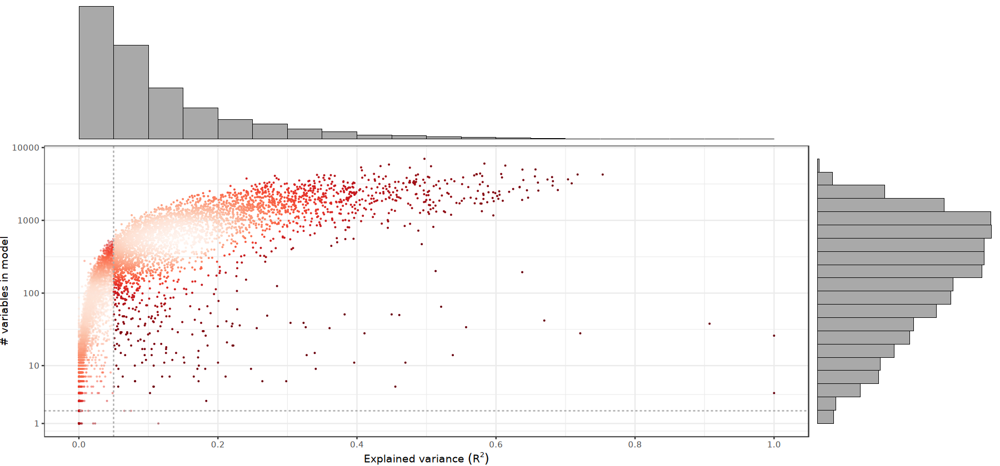

In [140]:
plot_gof(object = mannens_et_al_w_JOINT_eGRNs) # Check the goodness of fit plot for the inferred network.

In [141]:
mannens_et_al_w_JOINT_eGRNs@data %>% levels()

[1] "10X280" "10X290" "10X346" "10X365" "10X370" "10X402" "10X406"

In [142]:
mannens_seurat <- mannens_et_al_w_JOINT_eGRNs@data

In [143]:
Idents(mannens_seurat) <- 'main_cell_types'

In [144]:
mannens_seurat%>% levels()

[1] "Neurons"                                    
[2] "Radial and Glioblast"                       
[3] "Ventricular Zone Progenitor Cells (VZ_prog)"
[4] "Oligodendrocyte Precursors"                 
[5] "Vascular-Leptomeningeal Cells (VLMC)"       
[6] "Vascular Smooth Muscle Cells"               
[7] "Pericytes"                                  
[8] "Endothelial cells"                          
[9] "Immune Cells"

In [145]:
EC_detected_peaks_min5 <- 
    AccessiblePeaks(object = mannens_seurat, assay = 'peaks', idents = 'Endothelial cells', min.cells = 5)

In [146]:
EC_detected_peaks_min5 %>% length

[1] 391271

In [147]:
EC_eGRN_min5 <- mannens_et_al_w_JOINT_eGRNs

In [148]:
EC_eGRN_min5@grn@networks$glm_network@coefs <- 
                EC_eGRN_min5@grn@networks$glm_network@coefs %>% 
                            filter(region %in% EC_detected_peaks_min5)

In [149]:
coef(EC_eGRN_min5) %>% dim()

[1] 141951     10

In [150]:
EC_eGRN_min5  <- find_modules(
    EC_eGRN_min5, 
    p_thresh = 0.1,
    nvar_thresh = 2, 
    min_genes_per_module = 1, 
    rsq_thresh = 0.05
)

Found 428 TF modules



In [153]:
EC_eGRN_min5@grn@networks$glm_network@modules

An Modules object with 371 TF modules

In [154]:
mannens_et_al_w_JOINT_eGRNs %>% NetworkModules()

An Modules object with 492 TF modules

In [156]:
# Import network visualization functions:

source(here::here('r_scripts', 'network_visualization_functions_w_degree_option.r'))

make sure you installed the GGally, network, igraph and ggraph packages :)

First option: One can directly use only the node_names parameter to specify 
          the gene names to visualize in the graph

Second option: Use TF-names and/or target genes parameters 
         to visualize their connections

Registered S3 method overwritten by 'GGally':
  method from   
  +.gg   ggplot2


'network' 1.18.2 (2023-12-04), part of the Statnet Project
* 'news(package="network")' for changes since last version
* 'citation("network")' for citation information
* 'https://statnet.org' for help, support, and other information



Attaching package: 'igraph'


The following objects are masked from 'package:network':

    %c%, %s%, add.edges, add.vertices, delete.edges, delete.vertices,
    get.edge.attribute, get.edges, get.vertex.attribute, is.bipartite,
    is.directed, list.edge.attributes, list.vertex.attributes,
    set.edge.attribute, set.vertex.attribute


The following object is masked from 'p

In [157]:
options(repr.plot.width = 30, repr.plot.height = 24)

 Network attributes:
  vertices = 3802 
  directed = TRUE 
  hyper = FALSE 
  loops = FALSE 
  multiple = FALSE 
  bipartite = FALSE 
  total edges= 127329 
    missing edges= 0 
    non-missing edges= 127329 

 Vertex attribute names: 
    vertex.names 

 Edge attribute names not shown 


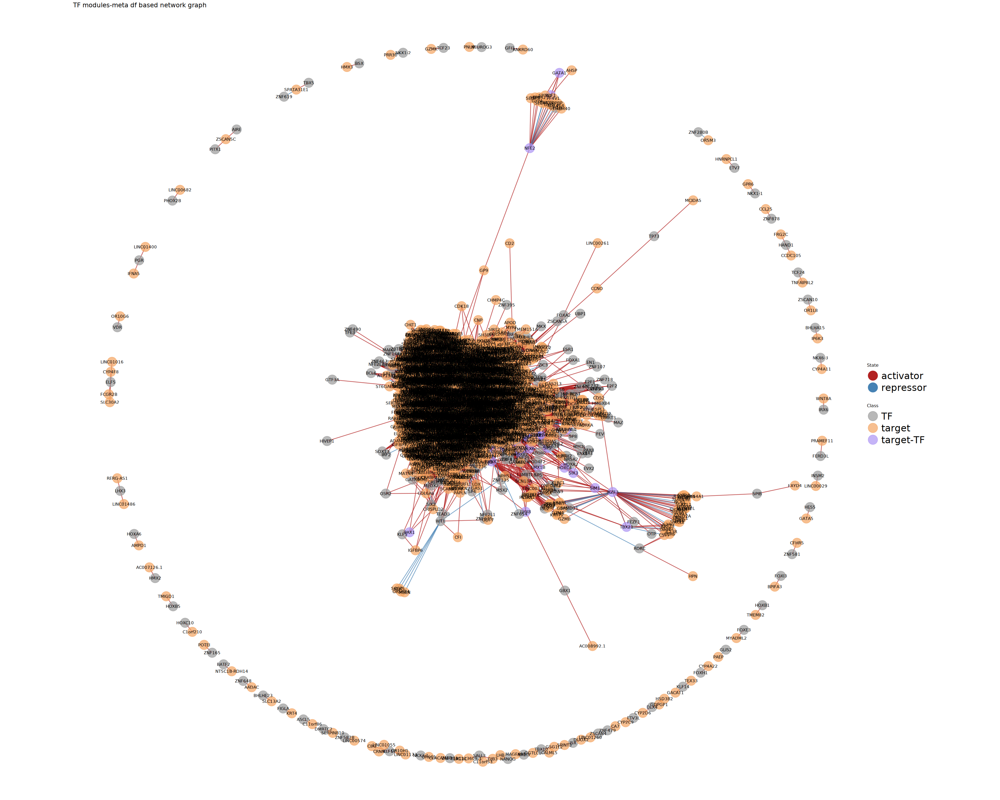

In [158]:
vis_network_w_GGNET2(meta_DF = NetworkModules(mannens_et_al_w_JOINT_eGRNs)@meta)

 Network attributes:
  vertices = 2681 
  directed = TRUE 
  hyper = FALSE 
  loops = FALSE 
  multiple = FALSE 
  bipartite = FALSE 
  total edges= 11804 
    missing edges= 0 
    non-missing edges= 11804 

 Vertex attribute names: 
    vertex.names 

 Edge attribute names not shown 


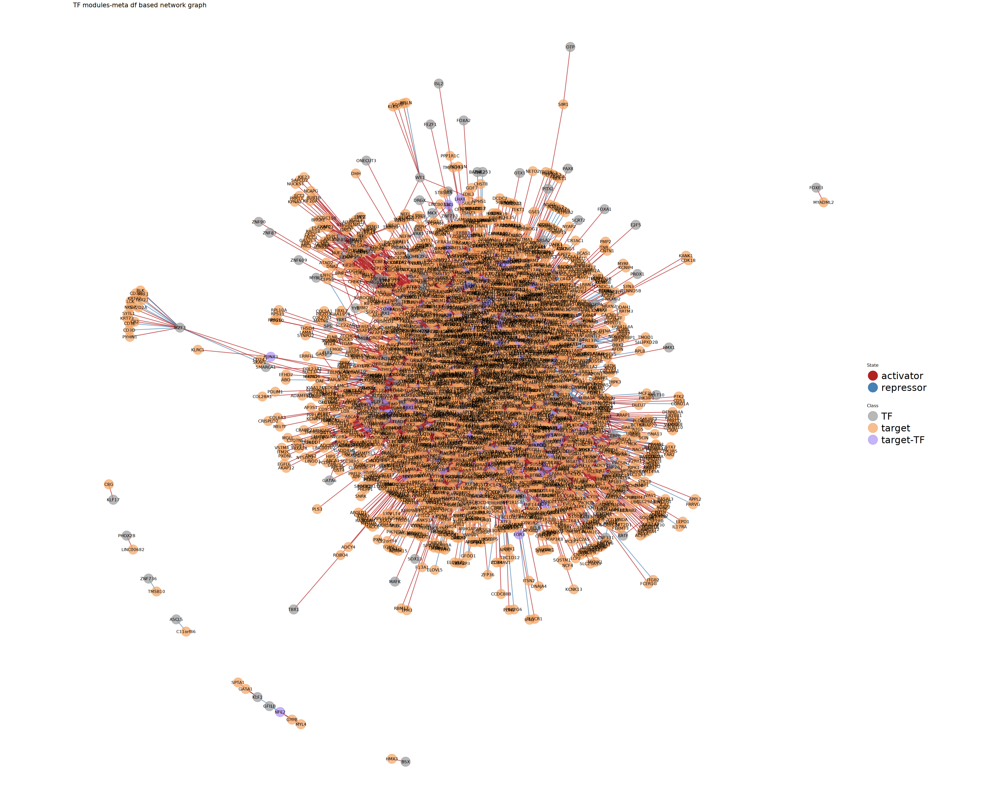

In [159]:
vis_network_w_GGNET2(meta_DF = NetworkModules(EC_eGRN_min5)@meta)

In [160]:
obj_dir <- '/fast/AG_Bunina/Yusuf/Project_Endothelial_and_Stroke/Datasets/Chromatin_and_Gene_Exp/2023_Zhu_et_al/Zhu_et_al_2023/24_09_24'

G_Bonilla_et_al_DE_data_sig_EC <- readRDS(file.path(obj_dir, 'R_Objects', 'DE_data_sig_EC.RDS'))

In [161]:
net_data_EC_min5 <- NetworkModules(EC_eGRN_min5)@meta %>% 
                        select(gene_name = target, feature = tf, weight = estimate)

In [162]:
# Run GRaNPA to generate the RF models:

res_EC_min5 <- GRaNPA::GRaNPA_Analysis(gene_metric_data = G_Bonilla_et_al_DE_data_sig_EC, 
                                       GRN_matrix = net_data_EC_min5)

Loading required package: futile.logger

Loading required package: caret

Loading required package: lattice


Attaching package: 'caret'


The following object is masked from 'package:purrr':

    lift




INFO [2025-03-14 16:21:07] GRaNPA version 2, predicting gene-specific values based on network data and reporting important transcription factors that can explain variations. Ensure input data is pre-filtered.
INFO [2025-03-14 16:21:07] Start of applying learning model
INFO [2025-03-14 16:21:07] number of features: 211
INFO [2025-03-14 16:21:07] number of Genes: 261
INFO [2025-03-14 16:21:36] Start of applying learning model
INFO [2025-03-14 16:21:36] number of features: 211
INFO [2025-03-14 16:21:36] number of Genes: 261


In [163]:
p1 <- GRaNPA::plot_GRaNPA_result(res = res_EC_min5$result) + 
                                ggtitle(label = 'accessible_regions_min_5_cells')

Loading required package: cowplot


Attaching package: 'cowplot'


The following object is masked from 'package:lubridate':

    stamp




In [164]:
p1.2 <- GRaNPA::plot_important_features(model = res_EC_min5$models$Real, n = 20) +
                                ggtitle(label = 'accessible_regions_min_5_cells')

In [165]:
options(repr.plot.width = 10, repr.plot.height = 10)

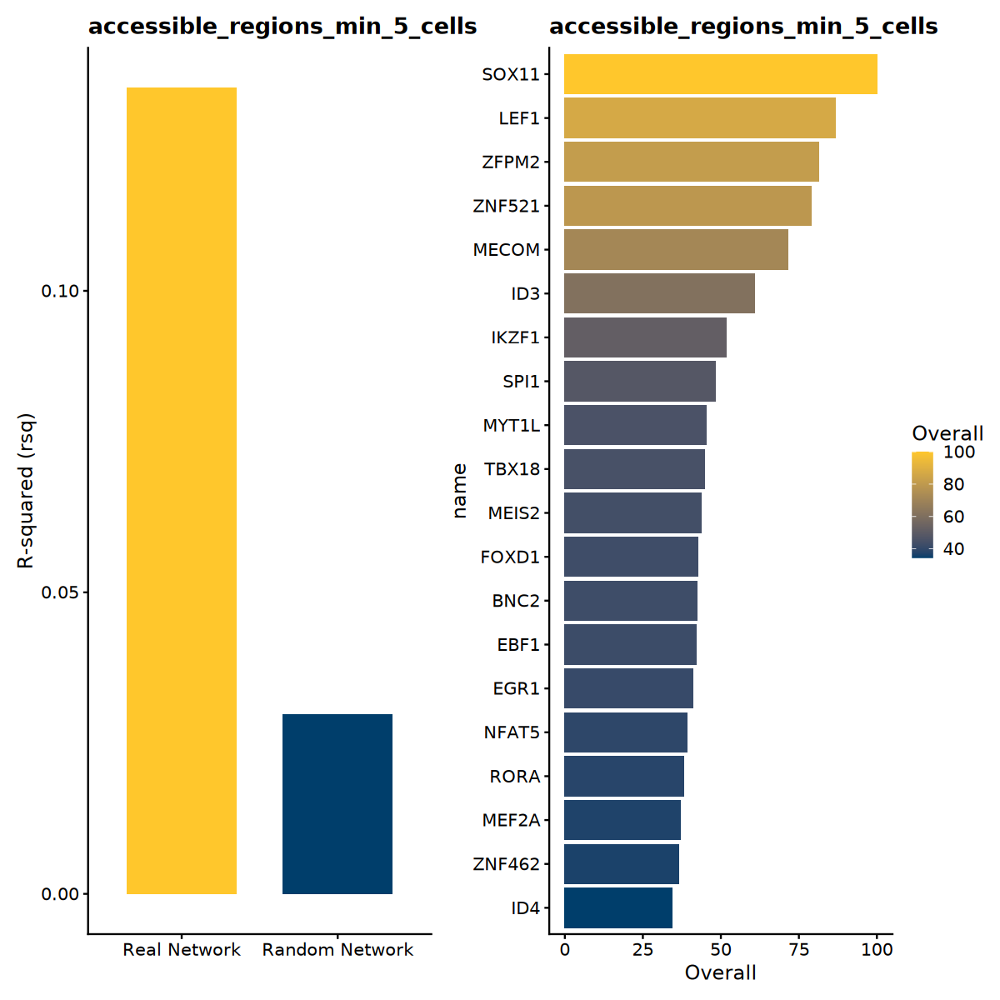

In [166]:
p1 + p1.2

In [167]:
# Just to see the impact of network size on Random Forest model:

net_data_ALL <- NetworkModules(mannens_et_al_w_JOINT_eGRNs)@meta %>% 
                        select(gene_name = target, feature = tf, weight = estimate)

In [168]:
# Run GRaNPA to generate the RF models:

res_ALL <- GRaNPA::GRaNPA_Analysis(gene_metric_data = G_Bonilla_et_al_DE_data_sig_EC, 
                                       GRN_matrix = net_data_ALL)

INFO [2025-03-14 16:28:19] GRaNPA version 2, predicting gene-specific values based on network data and reporting important transcription factors that can explain variations. Ensure input data is pre-filtered.
INFO [2025-03-14 16:28:19] Start of applying learning model
INFO [2025-03-14 16:28:19] number of features: 364
INFO [2025-03-14 16:28:19] number of Genes: 374
INFO [2025-03-14 16:28:53] Start of applying learning model
INFO [2025-03-14 16:28:53] number of features: 364
INFO [2025-03-14 16:28:53] number of Genes: 374


In [169]:
p1 <- GRaNPA::plot_GRaNPA_result(res = res_ALL$result) + 
                                ggtitle(label = 'ALL_cell_types')

In [170]:
p1.2 <- GRaNPA::plot_important_features(model = res_ALL$models$Real, n = 20) +
                                ggtitle(label = 'ALL_cell_types')

In [171]:
options(repr.plot.width = 10, repr.plot.height = 10)

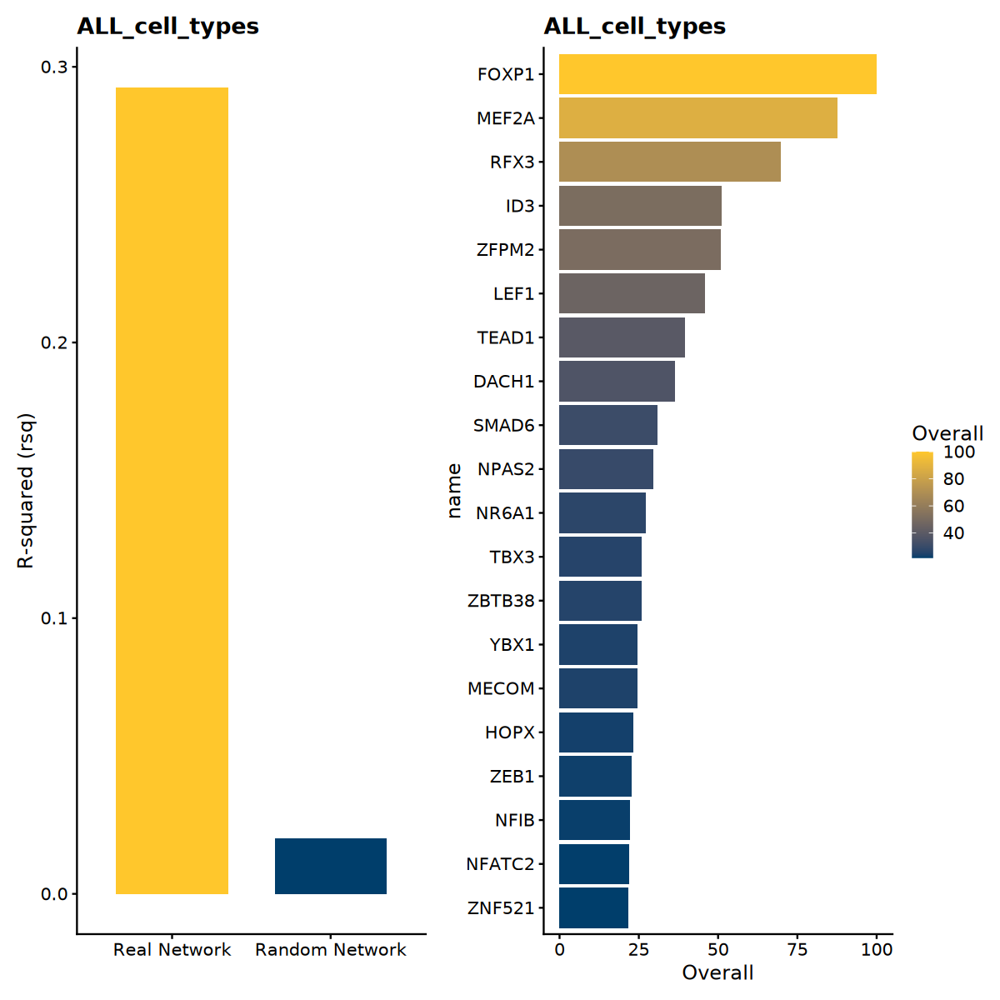

In [172]:
p1 + p1.2

In [300]:
# Generate EC plots again:

In [301]:
options(repr.plot.width = 30, repr.plot.height = 24)

In [302]:
p1_EC <- GRaNPA::plot_GRaNPA_result(res = res_EC_min5$result) + 
                                ggtitle(label = 'accessible_regions_min_5_cells')

In [303]:
p1.2_EC <- GRaNPA::plot_important_features(model = res_EC_min5$models$Real, n = 20) +
                                ggtitle(label = 'accessible_regions_min_5_cells')

In [304]:
options(repr.plot.width = 10, repr.plot.height = 10)

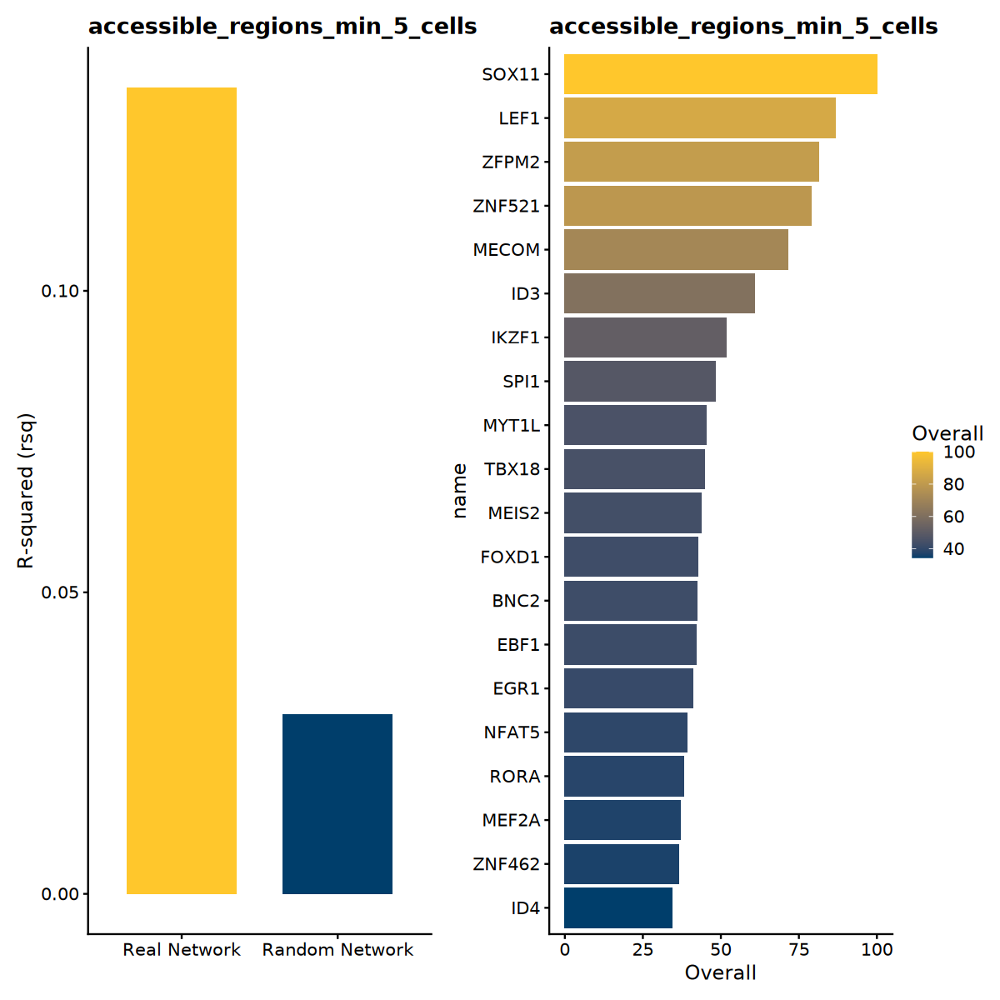

In [305]:
p1_EC + p1.2_EC

In [306]:
G_Bonilla_et_al_DE_data_sig_EC %>% head()

,gene_name,value
,<chr>,<dbl>
Tmsb4x,TMSB4Y,1.041881
Flt1,FLT1,-1.139497
Adgrf5,ADGRF5,-1.479323
Spock2,SPOCK2,-1.337619
Abcb1a,ABCB1,-1.401405
Ifitm3,IFITM3,1.398468


In [308]:
p1.2_EC$data %>% arrange(desc(Overall))

,Overall,name
,<dbl>,<fct>
SOX11,100.00000,SOX11
LEF1,86.83929,LEF1
ZFPM2,81.34444,ZFPM2
ZNF521,78.88043,ZNF521
MECOM,71.43192,MECOM
ID3,60.83114,ID3
IKZF1,51.81366,IKZF1
SPI1,48.13972,SPI1
MYT1L,45.39656,MYT1L


In [310]:
options(repr.plot.width = 30, repr.plot.height = 24)

 Network attributes:
  vertices = 42 
  directed = TRUE 
  hyper = FALSE 
  loops = FALSE 
  multiple = FALSE 
  bipartite = FALSE 
  total edges= 45 
    missing edges= 0 
    non-missing edges= 45 

 Vertex attribute names: 
    vertex.names 

No edge attributes


Scale for size is already present.
Adding another scale for size, which will replace the existing scale.


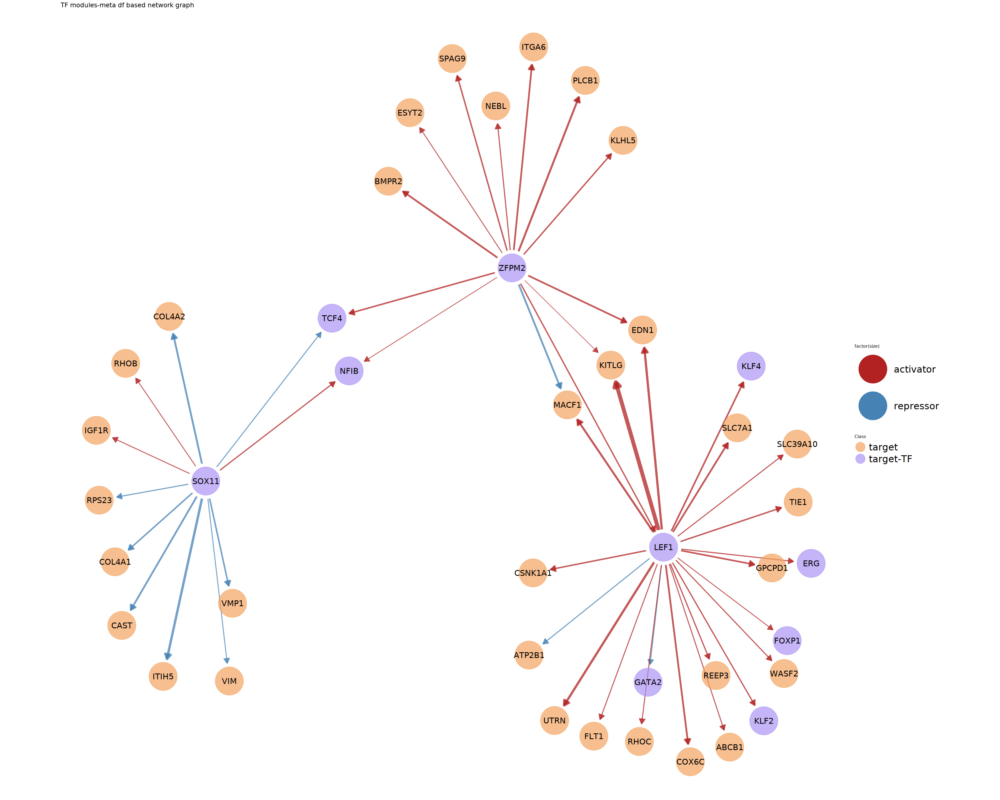

In [311]:
# or using another ggnet2 function with default subnetwork parameters:

vis_network_w_GGNET2(meta_DF = NetworkModules(EC_eGRN_min5)@meta,
                         subnetwork_default_node_and_label_size =  TRUE,
                         target_genes = G_Bonilla_et_al_DE_data_sig_EC$gene_name, 
                         TF_names = as.character(p1.2_EC$data %>% arrange(desc(Overall)) %>% pull(name))[1:3], 
                         arrow = TRUE)

In [312]:
options(repr.plot.width = 28, repr.plot.height = 7)

In [313]:
# Expression levels of important TFs in the endothelial cells:

p1 <- scCustomize::DotPlot_scCustom(seurat_object = mannens_seurat, 
                              group.by = 'main_cell_types',
                              colors_use = scCustomize::viridis_plasma_dark_high,
                              x_lab_rotate = TRUE, 
                              features = as.character(p1.2_EC$data %>% arrange(desc(Overall)) %>% pull(name))) +
                              ggtitle(label = 'Expression levels of important TFs across cell types') +
                              theme(plot.title = element_text(hjust = 0.5),  plot.margin = unit(c(1, 1, 1, 1), "cm")) # adjust the left margin

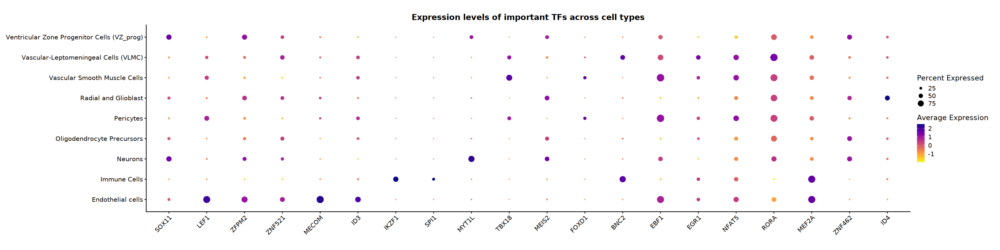

In [314]:
options(repr.plot.width = 28, repr.plot.height = 7)

p1

In [315]:
# Genes that are present both in network and differentially expressed gene list:

intersect(union(NetworkModules(EC_eGRN_min5)@meta$target, NetworkModules(EC_eGRN_min5)@meta$tf), G_Bonilla_et_al_DE_data_sig_EC$gene_name) %>% length

[1] 269

In [316]:
overlapping_DE_genes <-
    intersect(union(NetworkModules(EC_eGRN_min5)@meta$target, NetworkModules(EC_eGRN_min5)@meta$tf), G_Bonilla_et_al_DE_data_sig_EC$gene_name)

In [317]:
chunks <- seq(from = 1, to = length(overlapping_DE_genes), by = 50)

In [318]:
# Initialize an empty list to store plots
plot_list <- vector(mode = 'list', length = length(chunks))

# Loop through 'chunks' correctly
for (k in seq_along(chunks)) {
    
    # Get current index
    i <- chunks[k]
    
    # Define upper bound correctly
    if ( (length(overlapping_DE_genes) - i) < 50 ) {
        upper_bound <- max(0, length(overlapping_DE_genes) - i)  # Prevent negative values
    } else {
        upper_bound <- 49
    }
    
    # Generate the plot and store it in the list
    plot_list[[k]] <- scCustomize::DotPlot_scCustom(
        seurat_object = mannens_seurat, 
        group.by = 'main_cell_types',
        colors_use = scCustomize::viridis_plasma_dark_high,
        x_lab_rotate = TRUE, 
        features = overlapping_DE_genes[i:(i + upper_bound)]
    ) +
    ggtitle(label = glue::glue('Expression levels of overlapping mouse_stroke_DE genes across cell types: PART {k}')) +
    theme(plot.title = element_text(hjust = 0.5), plot.margin = unit(c(1, 1, 1, 1), "cm"))
}

In [319]:
my_theme <- ggplot2::theme(
    axis.title.x = ggplot2::element_text(size = 14),  # X-axis title size
    axis.title.y = ggplot2::element_text(size = 14),  # Y-axis title size
    axis.text.x  = ggplot2::element_text(size = 14, angle = 45, hjust = 1),  # X-axis tick labels
    axis.text.y  = ggplot2::element_text(size = 14),  # Y-axis tick labels
    legend.text  = ggplot2::element_text(size = 15)   # Legend text size
)

my_margin <- ggplot2::theme(plot.margin = ggplot2::unit(c(1, 1, 1, 1), "cm"))  # Add margin to top, right, bottom, and left margins, respectively.

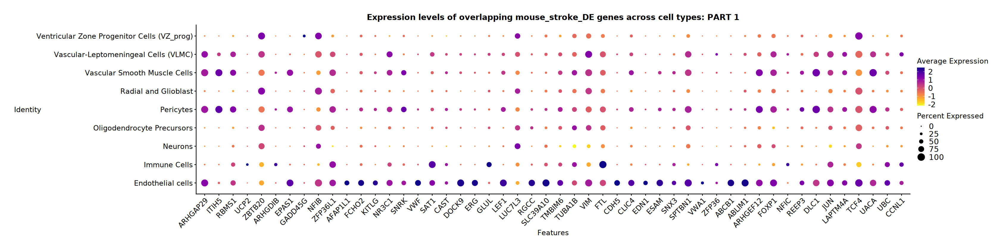

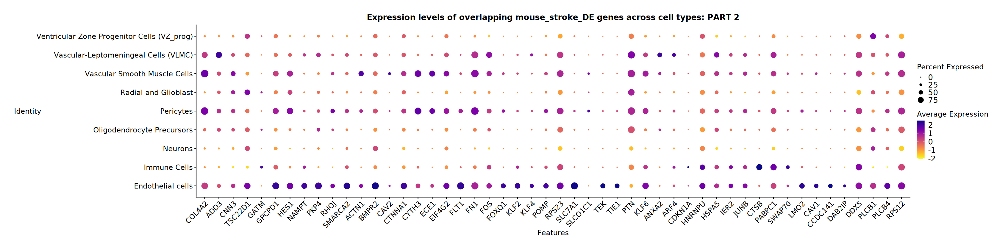

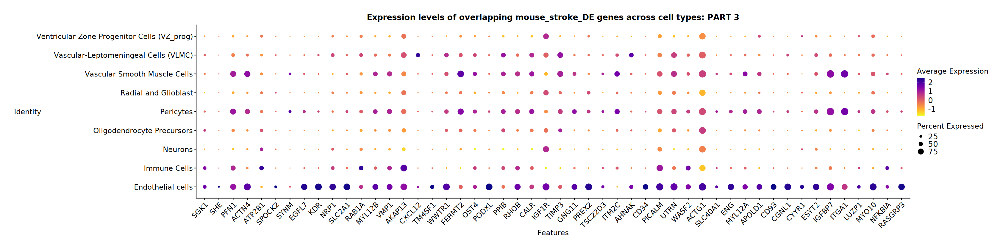

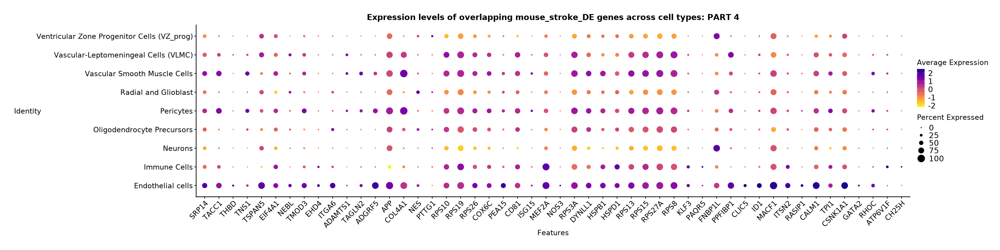

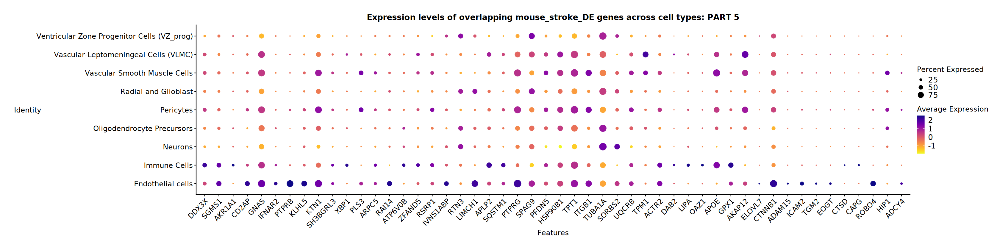

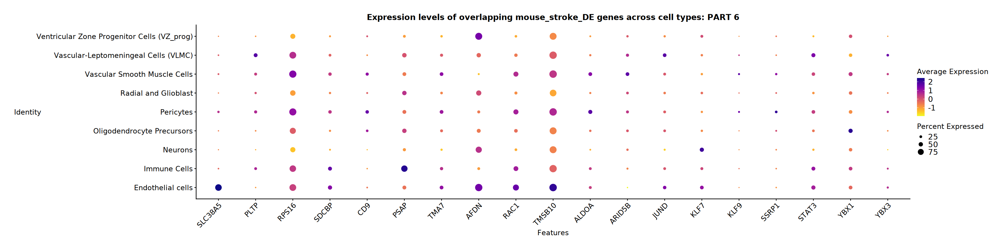

In [320]:
for(each_plot in plot_list) {

    print(each_plot + my_theme)

}

In [321]:
# Compare all peak regions and endothelial peak regions networks-trained models:

In [322]:
p1.1_ALL <- GRaNPA::plot_GRaNPA_result(res = res_ALL$result) + 
                                ggtitle(label = 'all_regions_in_all_cell_types')

In [323]:
p1.2_ALL <- GRaNPA::plot_important_features(model = res_ALL$models$Real, n = 20) +
                                ggtitle(label = 'ALL_cell_types')

In [324]:
options(repr.plot.width = 10, repr.plot.height = 10)

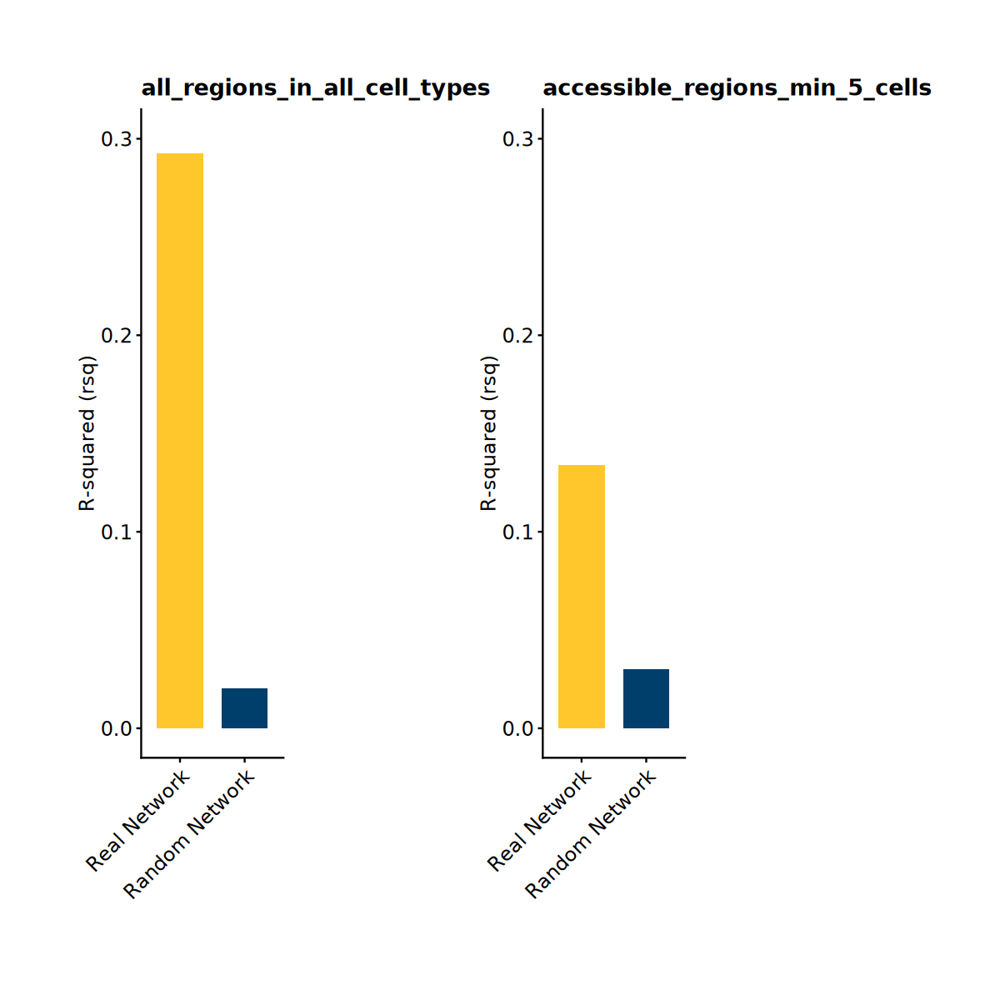

In [327]:
p1.1_ALL + p1_EC  & coord_cartesian(ylim = c(0, 0.3)) & my_theme & ggplot2::theme(plot.margin = ggplot2::unit(c(1, 4, 1, 1), "cm"))

==================================================================================================

I combined all chunks of Pando eGRNs into a single one.\
Then, I found TF modules in this network object.\
In addition, I filtered in the network's coefficient data frame\
with the regions that are of non-zero counts in at least 5\
endothelial cells. Then, I found TF modules.\
After viewing networks, I trained Random Forest models\
with GRaNPA package to inspect the relationship between networks'\
connections and differentially expressed genes in mouse stroke\
endothelial cells. I generated plots of model metrics and\
important TFs.

Network with all accessible regions resulted in a better model,\
with higher r squared value compared to random network. However,\
important TFs from this model should be evaluated with a grain of\
salt, since not all of the peak regions in this network are accessible\
in the endothelial cells.

I also viewed endothelial network graph with top 3 important TFs, \
and target genes with differential expression in mouse stroke ECs.\


I also viewed the expression levels of top 20 important TFs predicted by\
RF model trained on endothelial network, across cell types. Also the\
expression levels of target genes with diff. expression in stroke mouse\
ECs.

Finally, I generated a plot that compares all and EC specific\
network-trained models along same scale of y-axes.

==================================================

I will think about how to use Epiregulon- and Pando-generated\
networks to identify TF-regulons with post-ischemia alteration\
potential in human brain ECs.

In [329]:
sessionInfo()

R version 4.4.2 (2024-10-31)
Platform: x86_64-unknown-linux-gnu
Running under: Red Hat Enterprise Linux 9.4 (Plow)

Matrix products: default
BLAS/LAPACK: /gnu/store/mj1kw87qd3m1q7r4844adkn5hifx8k6a-openblas-0.3.20/lib/libopenblasp-r0.3.20.so;  LAPACK version 3.9.0

locale:
 [1] LC_CTYPE=C          LC_NUMERIC=C        LC_TIME=C          
 [4] LC_COLLATE=C        LC_MONETARY=C       LC_MESSAGES=C.UTF-8
 [7] LC_PAPER=C          LC_NAME=C           LC_ADDRESS=C       
[10] LC_TELEPHONE=C      LC_MEASUREMENT=C    LC_IDENTIFICATION=C

time zone: Europe/Berlin
tzcode source: system (glibc)

attached base packages:
[1] stats     graphics  grDevices utils     datasets  methods   base     

other attached packages:
 [1] cowplot_1.1.3       caret_6.0-94        lattice_0.22-6     
 [4] futile.logger_1.4.3 ggraph_2.2.1        igraph_2.1.4       
 [7] network_1.18.2      GGally_2.2.1        Pando_1.1.1        
[10] Signac_1.14.0       Seurat_5.2.1        SeuratObject_5.0.2 
[13] sp_2.2-0            